# Capstone Project

## Background

We are glad you have successfully reached the capstone project part of "Data Science Fundamentals" course. You will put everything 
you have learned so far about data science to work. The outcome of this module should potentially serve as your portfolio item.

Unlike with previous projects, this time you are free to choose a dataset to explore from three suggested ones. As you will have to solve a provided problem, there will not be list of predefined questions that you have to answer - be creative and explore any dimensions of data you deem worth analyzing.

Although this might seem scary, this is how data science looks like in the industry. Often, it's your responsibility to not only give answers using the data, but also raise questions. The more creatively you look at this project, the better. Good luck!

----

## Requirements

Whichever problem you choose to analyze, general requirements are as follow:

#### Exploratory Data Analysis
* Describe the data with basic statistical parameters - mean, median, quantiles, etc. Use parameters that give you the most important statistical insights of the data.
* Grouping the data and analyzing the groups - using Pandas aggregate methods.
* Work with features - handle missing data if needed, use pandas date APIs.
* Manipulate datasets - use joins in needed.
* Visualize the data - you can use line, scatter, histogram plots, density plots, regplots, etc.

#### Statistical hypothesis testing
* Use at least one statistical significance test.
* Report p-values.
* Use visualizations.

#### Modeling
* Visualize data with dimensionality reduction algorithms.
* Perform cluster analysis.
* Use a linear model to explain relationships and predict new values.

#### Presentation
* Present the project - the data, methods and results.

## Problems

#### COVID-19 crisis 

<div><img width="400px" height="auto" src="https://images.unsplash.com/photo-1574515944794-d6dedc7150de?ixlib=rb-1.2.1&ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&auto=format&fit=crop&w=1532&q=80" /></div>

The world is still struggling with one the most rapidly spreading pandemics. There are a lot of people who say that data is the best weapon we can use in this "Corona Fight". 

Imagine that you are one of the best data scientists in your country. The president of your country asked you to analyze the COVID-19 patient-level data of South Korea and prepare your homeland for the next wave of the pandemic. You, as the lead data scientist of your country **have to create and prove a plan of fighting the pandemics in your country** by analyzing the provided data. You must get most important insights using learned data science techniques and present them to the lead of your country.

https://www.kaggle.com/kimjihoo/coronavirusdataset/

#### 2016 US presidential elections

<div><img width="400px" height="auto" src="https://images.unsplash.com/photo-1583340806569-6da3d5ea9911?ixlib=rb-1.2.1&ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&auto=format&fit=crop&w=1315&q=80" /></div>

In 2016, Donald Trump lost the popular vote, yet he won the electoral vote, securing 4 years in the Oval Office. This has been a shock to democrat supporters all around the world.

Imagine you travel back in time to 2016. As soon as you step out of your time-capsule, the Democratic Party hires you. They want you, the best data scientist across the time and space, **to explain what happened and what should have been done differently**. They want you to **prepare them for 2020 presidential elections**.

The Party has some tips for you - inspect the voters. What are Trump supporters? What do they feature? What are our supporters? Where should focus next? Any pro-trump states? Cities?

The Democrats were kind of enough to share [a Kaggle dataset](https://www.kaggle.com/benhamner/2016-us-election) with you on 2016 U.S. elections. Use the data to help the Democrats.

#### Fatal Police Shooting in United States

<div><img width="400px" height="auto" src="https://images.unsplash.com/photo-1606352466047-7cef02b312bb?ixlib=rb-1.2.1&ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&auto=format&fit=crop&w=1662&q=80" /></div>

[Police brutality in the United States](https://en.wikipedia.org/wiki/Police_brutality_in_the_United_States) has been an nationwide issue since the 20th century. Public safety of U.S. citizens is a typical argument to justify the controversially high number of fatal shootings.

You are a contractor to the United States Department of Justice. **You have been given a case to investigate fatal police shootings throughout the United States of America, provide a list of issues, and propose a plan on how to tackle these issues**.

The department offered some tips - the public opinion indicates that there's something systematically fishy of police actions against civilians, some states differ from other, some cities are different from others, race equality is still an unanswered question, there's some talk about huge spendings on police, rumors about mental issues of those getting shot. Government is all about prioritizing - use the data to list issues with the police activity and propose a plan which issues to tackle first and how.

Your are given 1 dataset to start with. Try to search for more datasets to enrich your data analysis.

Here's the dataset:

* [Fatal Police Shootings in the U.S. '15 - '17](https://www.kaggle.com/washingtonpost/police-shootings).

## Evaluation Criteria

- Code quality
- Fulfillment of the idea
- Adherence to the requirements
- Delivery of the presentation

#### Statistical hypothesis testing
- Correct statistical test method is used, based on the situation.
- Reasoning on chosen statistical significance level.

#### Modeling
- Both PCA and T-SNE algorithms are used.

# COVID-19 crisis 

In [88]:
import pandas as pd
import numpy as np

from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from kneed import KneeLocator

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import seaborn as sns

import folium
import json
from folium import plugins

In [ ]:
cases = pd.read_csv("Time.csv")
patients = pd.read_csv("PatientInfo.csv")
region = pd.read_csv("Region.csv")
policy = pd.read_csv("Policy.csv")
city_coord = pd.read_csv("city_coordinates.csv", sep=";")

## Exploratory Data Analysis

### Cases

Let's begin from the main parameters and trends overviews: 
* total cases
* active cases
* new cases 

In [3]:
# active and new cases parameters calculation

cases["active"] = cases["confirmed"] - cases["released"] - cases["deceased"]
cases["new cases"] = cases["confirmed"] - cases["confirmed"].shift()
cases["new cases"] = cases["new cases"].fillna(0)

In [4]:
cases.head(3)

,date,time,test,negative,confirmed,released,deceased,active,new cases
0,2020-01-20,16,1,0,1,0,0,1,0.0
1,2020-01-21,16,1,0,1,0,0,1,0.0
2,2020-01-22,16,4,3,1,0,0,1,0.0


In [4]:
cases.describe()

,time,test,negative,confirmed,released,deceased,active,new cases
count,163.000000,1.630000e+02,1.630000e+02,163.000000,163.000000,163.000000,163.000000,163.000000
mean,4.122699,4.977797e+05,4.754839e+05,7834.865031,5604.312883,157.104294,2073.447853,78.521472
std,7.019174,3.958830e+05,3.865611e+05,4666.040541,4544.317229,114.010916,2148.467238,136.345664
min,0.000000,1.000000e+00,0.000000e+00,1.000000,0.000000,0.000000,1.000000,0.000000
25%,0.000000,9.648800e+04,5.877400e+04,3443.000000,29.000000,17.500000,719.500000,9.000000
50%,0.000000,5.030510e+05,4.773030e+05,10450.000000,7117.000000,208.000000,1135.000000,34.000000
75%,16.000000,7.825585e+05,7.542225e+05,11116.000000,10100.500000,263.500000,3115.000000,80.000000
max,16.000000,1.273766e+06,1.240157e+06,12800.000000,11537.000000,282.000000,7470.000000,813.000000


Let's visually see how it distributed over time:

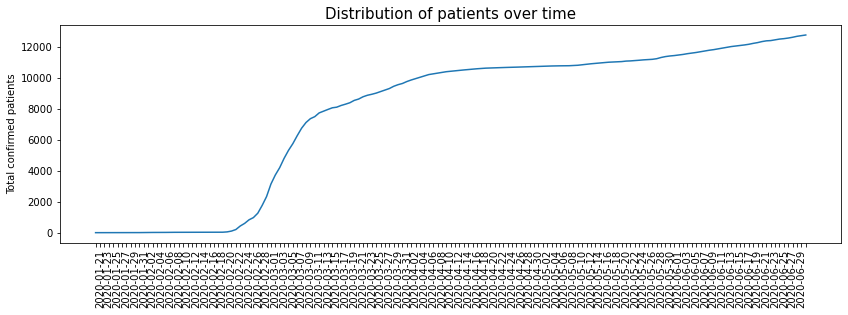

In [5]:
fig, ax = plt.subplots(figsize=(14, 4))
fig = sns.lineplot(data=cases, x="date", y="confirmed")

plt.xticks(rotation=90)
for label in ax.get_xaxis().get_ticklabels()[::2]:
    label.set_visible(False)

plt.xlabel("")
plt.ylabel("Total confirmed patients")
plt.title("Distribution of patients over time", fontsize=15);

From the plot above we can see that the spread was very rapid - from one patient in the second part of February to 8000 in less than a month. Nevertheless, it seems that spread was slowed down already in 3 weeks but in June it seems to start growing again. 

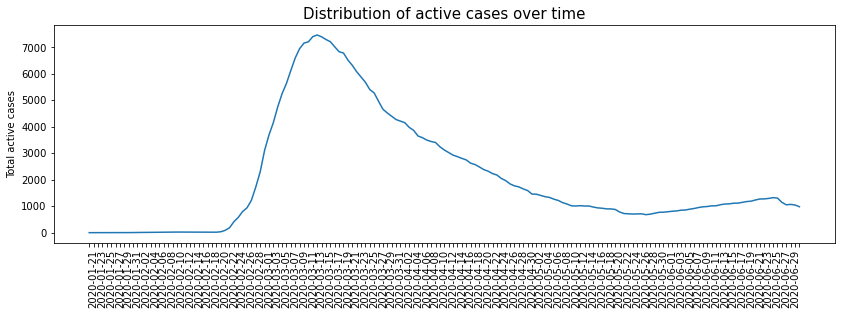

In [6]:
fig, ax = plt.subplots(figsize=(14, 4))
sns.lineplot(data=cases, x="date", y="active")

plt.xticks(rotation=90)
for label in ax.get_xaxis().get_ticklabels()[::2]:
    label.set_visible(False)

plt.xlabel("")
plt.ylabel("Total active cases")
plt.title("Distribution of active cases over time", fontsize=15);

Active cases plot confirms the previous plot, but it is easier to understand contemporary situation in the country. Here we see that number of active cases were steadily falling until June and when it started to picking up faster. It can be both - or number of new cases grew at faster pace, or people were sick longer. It could help to assume hospitalization status in the country or identify mutations of virus. 

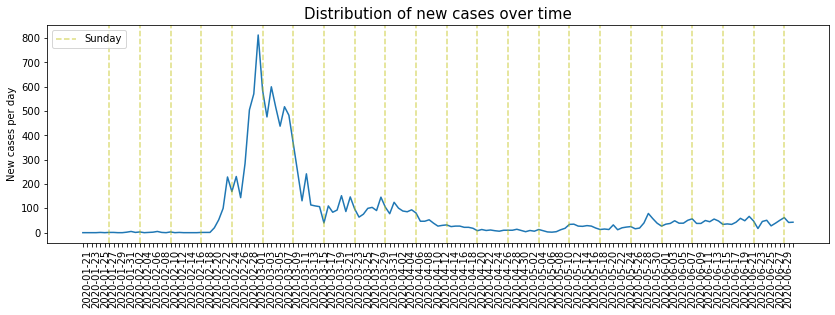

In [22]:
fig, ax = plt.subplots(figsize=(14, 4))
sns.lineplot(data=cases, x="date", y="new cases")

label = {"Sunday": "Sunday"}
xposition = cases["date"]
for Sunday in xposition[6::7]:
    ax.axvline(x=Sunday, linestyle="dashed", alpha=0.5, color="y", label=label["Sunday"])
    label["Sunday"] = "_nolegend_"
    
plt.xticks(rotation=90)
for label in ax.get_xaxis().get_ticklabels()[::2]:
    label.set_visible(False)

plt.xlabel("")
plt.ylabel("New cases per day")
plt.legend()
plt.title("Distribution of new cases over time", fontsize=15);

New cases plot shows the similar pattern as before but here we can see drops. Some could be related to lower testing in weekends while others are in the middle of the week and can be caused for example delays of the results.     
Moreoever, growth in June is not so obvious anymore so we could raise hypothesis that patients were sick longer . It could let us assume virus mutations, lower immune system or other reasons. 

### Patients, their age and sex

In [158]:
patients.head(3)

,patient_id,sex,age,country,province,city,infection_case,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state,upd_source
0,1000000001,male,50s,Korea,Seoul,Gangseo-gu,overseas inflow,NaN,75,2020-01-22,2020-01-23,2020-02-05,NaN,released,overseas inflow
1,1000000002,male,30s,Korea,Seoul,Jungnang-gu,overseas inflow,NaN,31,NaN,2020-01-30,2020-03-02,NaN,released,overseas inflow
2,1000000003,male,50s,Korea,Seoul,Jongno-gu,contact with patient,2002000001,17,NaN,2020-01-30,2020-02-19,NaN,released,contact with patient


In [23]:
# what is the distribution of patients between age and gender groups
patients_by_age = patients.groupby(["age", "sex"], as_index=False).agg(
    total=("patient_id", "count")
)

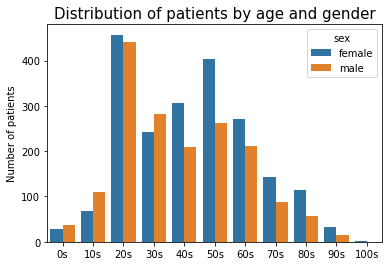

In [24]:
sns.barplot(
    data=patients_by_age,
    x="age",
    y="total",
    hue="sex",
    order=["0s", "10s", "20s", "30s", "40s", "50s", "60s", "70s", "80s", "90s", "100s"],
)

plt.xlabel("")
plt.ylabel("Number of patients")
plt.title("Distribution of patients by age and gender", fontsize=15);

20s both genders and 50s female seem to be the most infected. Let's see if their source of infection differs from the rest of the population. To do so, let's start from checking the infection sourse types. 

### Sources of infection

In [11]:
# what are the sources of infection
patients["infection_case"].unique()

array(['overseas inflow', 'contact with patient', 'Seongdong-gu APT',
       'etc', "Eunpyeong St. Mary's Hospital", 'Shincheonji Church',
       'Dongan Church', 'Guro-gu Call Center', nan, 'Itaewon Clubs',
       'Samsung Medical Center', 'Biblical Language study meeting',
       'Coupang Logistics Center', 'Guri Collective Infection',
       'KB Life Insurance', 'Gangnam Dongin Church',
       'Korea Campus Crusade of Christ',
       'Yeongdeungpo Learning Institute', 'Yeonana News Class',
       'SMR Newly Planted Churches Group', 'Seocho Family',
       'Anyang Gunpo Pastors Group', 'Richway',
       'Samsung Fire & Marine Insurance', 'Yangcheon Table Tennis Club',
       'Yongin Brothers', 'Day Care Center',
       'Geumcheon-gu rice milling machine manufacture', 'Daezayeon Korea',
       'Orange Life', 'Daejeon door-to-door sales',
       'Seoul City Hall Station safety worker', 'Uiwang Logistics Center',
       'Wangsung Church', 'Gangnam Yeoksam-dong gathering',
       'Onchun

Most of the names do not explain the origin of infection. Apparently, some googling will be necessary. 
Before that, let's see what is the distribution over current listing. 

In [25]:
# data and it's cleaning for visualization

source = patients.groupby(["infection_case"]).agg(total=("patient_id", "count"))
source = source.reset_index()
source = source.sort_values("total", ascending=False)

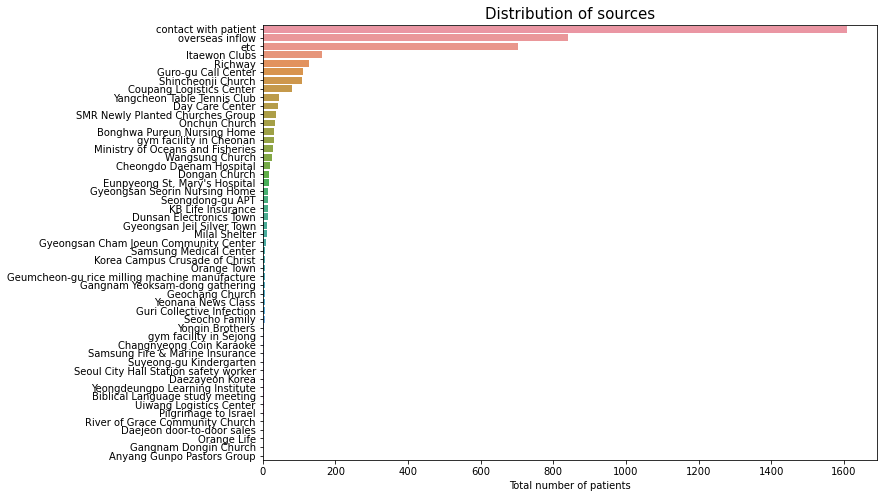

In [26]:
plt.figure(figsize=(11, 8))
sns.barplot(x="total", y="infection_case", data=source)

plt.xlabel("Total number of patients")
plt.ylabel("")
plt.title("Distribution of sources", fontsize=15);

From the above plot we can see 3 main infection sources: contact with patient, overseas inflow or "etc." which is same as unknown. These groups shall remain the same while others can be merged to groups. 

In [27]:
source_groups = {
    "overseas inflow": ["overseas inflow"],
    "contact with patient": ["contact with patient"],
    "unknow": ["etc", "nan"],
    "rental": ["Seongdong-gu APT", "Seocho Family"],
    "medical institution": [
        "Eunpyeong St. Mary's Hospital",
        "Samsung Medical Center",
        "Cheongdo Daenam Hospital",
        "SMR Newly Planted Churches Group",
        "Korea Campus Crusade of Christ",
        "River of Grace Community Church",
        "Anyang Gunpo Pastors Group",
        "Geochang Church",
    ],
    "church": [
        "Shincheonji Church",
        "Dongan Church",
        "Gangnam Dongin Church",
        "Wangsung Church",
        "Onchun Church",
    ],
    "education institution": [
        "Biblical Language study meeting",
        "Yeongdeungpo Learning Institute",
        "Suyeong-gu Kindergarten",
        "Yeonana News Class",
    ],
    "business": [
        "Guro-gu Call Center",
        "Coupang Logistics Center",
        "Geumcheon-gu rice milling machine manufacture",
        "Ministry of Oceans and Fisheries",
        "KB Life Insurance",
        "Samsung Fire & Marine Insurance",
        "Uiwang Logistics Center",
        "Orange Life",
        "Seoul City Hall Station safety worker",
    ],
    "nightlife": [
        "Itaewon Clubs",
        "Changnyeong Coin Karaoke",
        "Gangnam Yeoksam-dong gathering",
    ],
    "group": [
        "Guri Collective Infection",
        "Yongin Brothers",
        "Daezayeon Korea",
        "Orange Town",
        "Gyeongsan Jeil Silver Town",
        "Pilgrimage to Israel",
    ],
    "door-to-door sales": ["Richway", "Daejeon door-to-door sales"],
    "sports": [
        "Yangcheon Table Tennis Club",
        "gym facility in Sejong",
        "gym facility in Cheonan",
    ],
    "centers": [
        "Day Care Center",
        "Gyeongsan Seorin Nursing Home",
        "Gyeongsan Cham Joeun Community Center",
        "Bonghwa Pureun Nursing Home",
        "Milal Shelter",
    ],
    "stores": ["Dunsan Electronics Town"],
}


def update_source(item):
    for genre, subgenres in source_groups.items():
        if item in subgenres:
            return genre

    return None


patients["upd_source"] = patients["infection_case"].apply(lambda x: update_source(x))

In [28]:
source_upd = patients.groupby(["upd_source"]).agg(total=("patient_id", "count"))
source_upd = source_upd.reset_index()
source_upd = source_upd.sort_values("total", ascending=False)

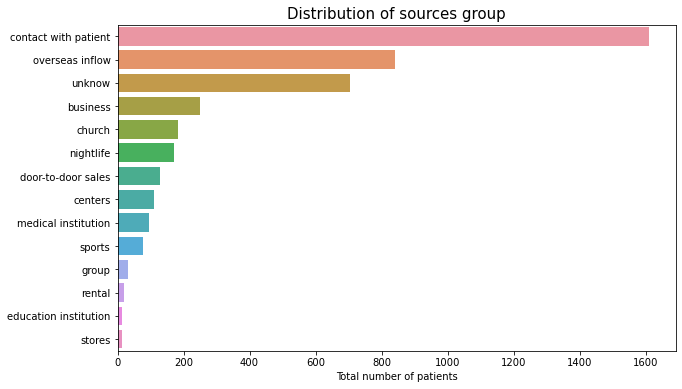

In [30]:
plt.figure(figsize=(10, 6))
sns.barplot(x="total", y="upd_source", data=source_upd)

plt.xlabel("Total number of patients")
plt.ylabel("")
plt.title("Distribution of sources group", fontsize=15);

## Most infected people groups

### 20s group

Now let's go back to the initial question if the most infected groups differ by their infection cause from the total population.

In [31]:
causes_of_20s = patients.query('age == "20s"')[["upd_source", "patient_id"]]
causes_20s = (
    causes_of_20s.groupby(["upd_source"])
    .agg(total=("patient_id", "count"))
    .reset_index()
)

causes_of_50_fem = patients.query('age == "50s" & sex == "female"')[
    ["upd_source", "patient_id"]
]
causes_50_fem = (
    causes_of_50_fem.groupby(["upd_source"])
    .agg(total=("patient_id", "count"))
    .reset_index()
)

In [56]:
source_upd["Percent"] = source_upd["total"] / source_upd["total"].sum() * 100
causes_20s["Percent"] = causes_20s["total"] / causes_20s["total"].sum() * 100
causes_50_fem["Percent"] = causes_50_fem["total"] / causes_50_fem["total"].sum() * 100

In [61]:
def low_to_other(df, percent):
    other_total = 0
    other_percent = 0
    for index, row in df.iterrows():
        if row["Percent"] < percent:
            other_total = other_total + row["total"]
            other_percent = other_percent + row["Percent"]
            df.drop(index, inplace=True)
    other = {"upd_source": "other", "total": other_total, "Percent": other_percent}
    df = df.append(other, ignore_index=True)
    return df

In [64]:
source_upd_other = low_to_other(source_upd, 4)
causes_20s_other = low_to_other(causes_20s, 4)
causes_50_fem_other = low_to_other(causes_50_fem, 4)

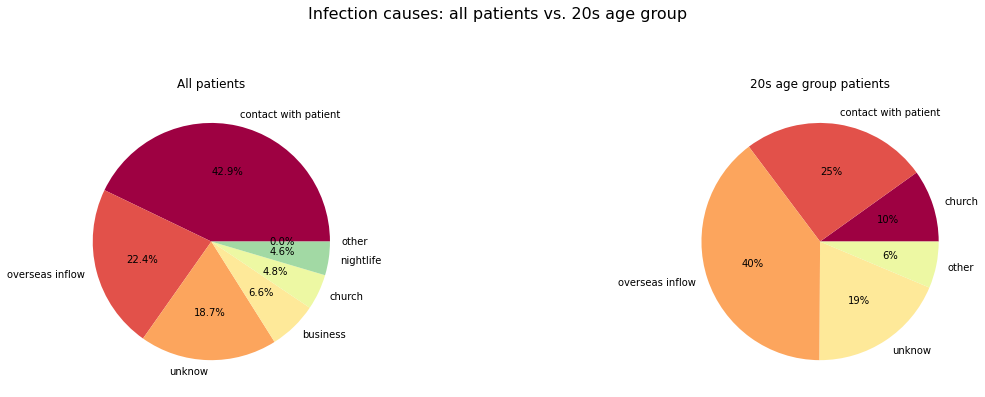

In [65]:
plt.figure(1, figsize=(20, 12))
the_grid = GridSpec(2, 2)

cmap = plt.get_cmap("Spectral")
colors = [cmap(i) for i in np.linspace(0, 1, 8)]

plt.subplot(the_grid[0, 0], aspect=1, title="All patients")
causes_all = plt.pie(
    source_upd_other["total"],
    labels=source_upd_other["upd_source"],
    autopct="%1.1f%%",
    colors=colors,
)

plt.subplot(the_grid[0, 1], aspect=1, title="20s age group patients")
causes_20s_age = plt.pie(
    causes_20s_other["total"],
    labels=causes_20s_other["upd_source"],
    autopct="%.0f%%",
    colors=colors,

)

plt.suptitle("Infection causes: all patients vs. 20s age group", fontsize=16)
plt.show()

Most of the 20s patients got Covid-19 infection by cause 'overseas inflow' or, in other words, brought it from abroad. Due to this cause they were infected twice as much as the total population. Let's see how it looks over time with government regulations for travelling. 

#### Government regulations

In [68]:
# creating few dataframes for new cases in 20s age group

dates_20s = patients.query('age == "20s"')[["patient_id", "confirmed_date"]]
timeline_20s = dates_20s.groupby(["confirmed_date"]).agg(total=("patient_id", "count"))

dates_20s_overseas = patients.query('age == "20s" & upd_source == "overseas inflow"')[
    ["patient_id", "confirmed_date"]
]
timeline_20s_overseas = dates_20s_overseas.groupby(["confirmed_date"]).agg(
    overseas=("patient_id", "count")
)

dates_20s_none = patients.query('age == "20s" & upd_source == "unknow"')[
    ["patient_id", "confirmed_date"]
]
timeline_20s_none = dates_20s_none.groupby(["confirmed_date"]).agg(
    none=("patient_id", "count")
)

data_20s_two = pd.merge(
    timeline_20s, timeline_20s_overseas, on="confirmed_date", how="left"
)
data_20s_all = pd.merge(
    data_20s_two, timeline_20s_none, on="confirmed_date", how="left"
).fillna(0)

In [20]:
# and investigating what policies were introduced regarding travelling
policy["type"].unique()

array(['Alert', 'Immigration', 'Health', 'Social', 'Education',
       'Technology', 'Administrative', 'Transformation'], dtype=object)

In [69]:
immigration_policy = policy.query('type == "Immigration"')[
    ["gov_policy", "detail", "start_date", "end_date"]
]

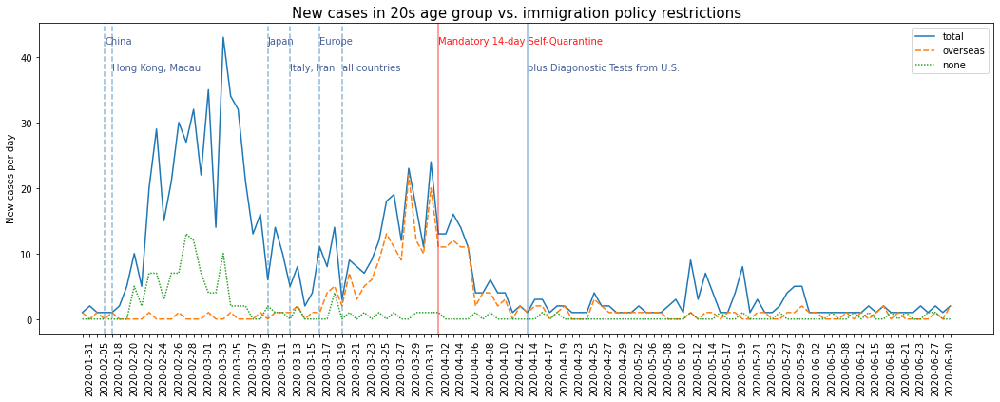

In [70]:
fig, events = plt.subplots(figsize=(18, 6))
sns.lineplot(data=data_20s_all)

events.axvline(x="2020-02-05", linestyle="dashed", alpha=0.5)
events.text(x="2020-02-05", y=42, s="China", alpha=0.9, color="#334f8d")

events.axvline(x="2020-02-07", linestyle="dashed", alpha=0.5)
events.text(x="2020-02-07", y=38, s="Hong Kong, Macau", alpha=0.9, color="#334f8d")

events.axvline(x="2020-03-09", linestyle="dashed", alpha=0.5)
events.text(x="2020-03-09", y=42, s="Japan", alpha=0.9, color="#334f8d")

events.axvline(x="2020-03-12", linestyle="dashed", alpha=0.5)
events.text(x="2020-03-12", y=38, s="Italy, Iran", alpha=0.9, color="#334f8d")

events.axvline(x="2020-03-16", linestyle="dashed", alpha=0.5)
events.text(x="2020-03-16", y=42, s="Europe", alpha=0.9, color="#334f8d")

events.axvline(x="2020-03-19", linestyle="dashed", alpha=0.5)
events.text(x="2020-03-19", y=38, s="all countries", alpha=0.9, color="#334f8d")

events.axvline(x="2020-04-01", linestyle="solid", alpha=0.5, color="r")
events.text(
    x="2020-04-01", y=42, s="Mandatory 14-day Self-Quarantine", alpha=0.9, color="r"
)

events.axvline(x="2020-04-13", linestyle="solid", alpha=0.5)
events.text(
    x="2020-04-13",
    y=38,
    s="plus Diagonostic Tests from U.S.",
    alpha=0.9,
    color="#334f8d",
)

plt.xticks(rotation=90)
for label in events.get_xaxis().get_ticklabels()[::2]:
    label.set_visible(False)

plt.xlabel("")
plt.ylabel("New cases per day")
plt.title("New cases in 20s age group vs. immigration policy restrictions", fontsize=15);

In the beginning, there were quite some cases with an unknown (_none_) source of infection which can influence that the February's data is inaccurate and it is hard to understand the impact of policies. 
Despite the cause of infection, it seems that South Korea was constantly watching Covid-19 situation abroad and updating their immigration policies accordingly. Taking into account that there is a delay of 14 days for positive test results, seems that restrictions helped to suppress the spreading, especially among 20s whose most common source of infection was from overseas. 

### 50s female group

Another group was females in their 50s. Let's see what was the main cause of infection there:

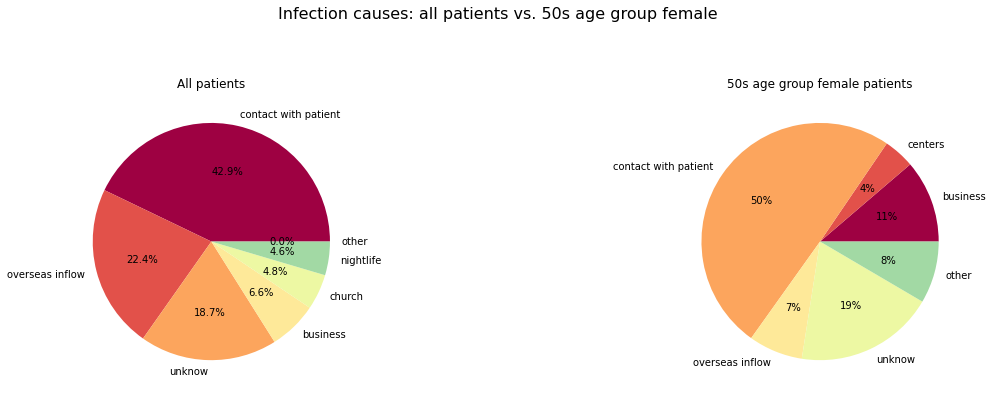

In [66]:
plt.figure(1, figsize=(20, 12))
the_grid = GridSpec(2, 2)

cmap = plt.get_cmap("Spectral")
colors = [cmap(i) for i in np.linspace(0, 1, 8)]

plt.subplot(the_grid[0, 0], aspect=1, title="All patients")
causes_all = plt.pie(
    source_upd_other["total"],
    labels=source_upd_other["upd_source"],
    autopct="%1.1f%%",
    colors=colors,
)


plt.subplot(the_grid[0, 1], aspect=1, title="50s age group female patients")
causes_50s_age_fem = plt.pie(
    causes_50_fem_other["total"],
    labels=causes_50_fem_other["upd_source"],
    autopct="%.0f%%",
    colors=colors,
)

plt.suptitle("Infection causes: all patients vs. 50s age group female", fontsize=16)
plt.show()

With this group it seems that lack of social distancing was the main reason of getting the infection. Maybe this group mainly contacted their kids from the plots above? 
Let's see what policies were applied for social distancing and if it had a positive result. 

#### Government regulations

In [71]:
# collecting the data

dates_50s_fem = patients.query('sex == "female" & age == "50s"')[
    ["patient_id", "confirmed_date"]
]
timeline_50s_fem = dates_50s_fem.groupby(["confirmed_date"]).agg(
    total=("patient_id", "count")
)

dates_50s_fem_contact = patients.query(
    'sex == "female" & age == "50s" & upd_source == "contact with patient"'
)[["patient_id", "confirmed_date"]]
timeline_50s_fem_contacts = dates_50s_fem_contact.groupby(["confirmed_date"]).agg(
    contact=("patient_id", "count")
)

dates_50s_fem_none = patients.query(
    'sex == "female" & age == "50s" & upd_source == "unknow"'
)[["patient_id", "confirmed_date"]]
timeline_50s_fem_none = dates_50s_fem_none.groupby(["confirmed_date"]).agg(
    none=("patient_id", "count")
)

data_50s_fem_two = pd.merge(
    timeline_50s_fem, timeline_50s_fem_contacts, on="confirmed_date", how="left"
)
data_50s_fem_all = pd.merge(
    data_50s_fem_two, timeline_50s_fem_none, on="confirmed_date", how="left"
).fillna(0)

In [72]:
# and investigating what policies were introduced regarding travelling
immigration_policy = policy.query('type == "Social"')[
    ["gov_policy", "detail", "start_date", "end_date"]
]

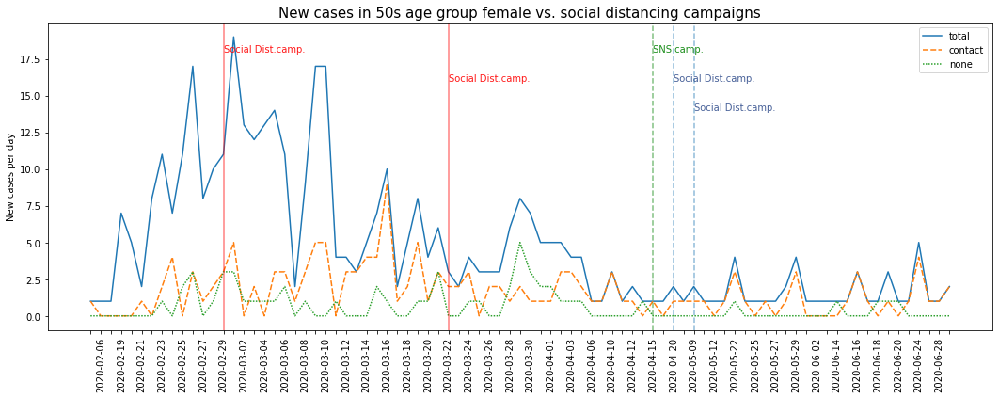

In [74]:
fig, events = plt.subplots(figsize=(18, 6))
sns.lineplot(data=data_50s_fem_all)

events.axvline(x="2020-02-29", linestyle="solid", alpha=0.5, color="r")
events.text(x="2020-02-29", y=18, s="Social Dist.camp.", alpha=0.9, color="r")

events.axvline(x="2020-03-22", linestyle="solid", alpha=0.5, color="r")
events.text(x="2020-03-22", y=16, s="Social Dist.camp.", alpha=0.9, color="r")

events.axvline(x="2020-04-15", linestyle="dashed", alpha=0.5, color="g")
events.text(x="2020-04-15", y=18, s="SNS camp.", alpha=0.9, color="g")

events.axvline(x="2020-04-20", linestyle="dashed", alpha=0.5)
events.text(x="2020-04-20", y=16, s="Social Dist.camp.", alpha=0.9, color="#334f8d")

events.axvline(x="2020-05-09", linestyle="dashed", alpha=0.5)
events.text(x="2020-05-09", y=14, s="Social Dist.camp.", alpha=0.9, color="#334f8d")

plt.xticks(rotation=90)
for label in events.get_xaxis().get_ticklabels()[::2]:
    label.set_visible(False)

plt.xlabel("")
plt.ylabel("New cases per day")
plt.title(
    "New cases in 50s age group female vs. social distancing campaigns", fontsize=15
);

Similar to 20s group, in the beginning of pandemic in the country, it seems that source of infection was not well defined. 
Despite the fact, taking into consideration 2 weeks infection window, social distancing campaigns could have helped to improve the results as we see a drop from after 2 weeks (middle of March) after the 1st strong campaign and another drop after 2 weeks (beggining of April) after 2nd strong campaign. 

## Additional government regulations

So we saw what government actions could have possibly impacted overseas and contact with patient groups, but let's see if there were any other significant actions towards the of first wave (around 10th of March, 2020). 

In [75]:
wave_1st_cases = cases.query('date > "2020-02-22" & date < "2020-03-20"')

In [76]:
wave_1st_policy = policy.query(
    'start_date > "2020-02-22" & start_date < "2020-03-20" & type != "Immigration" & type != "Social"'
)[["type", "gov_policy", "detail", "start_date", "end_date"]]

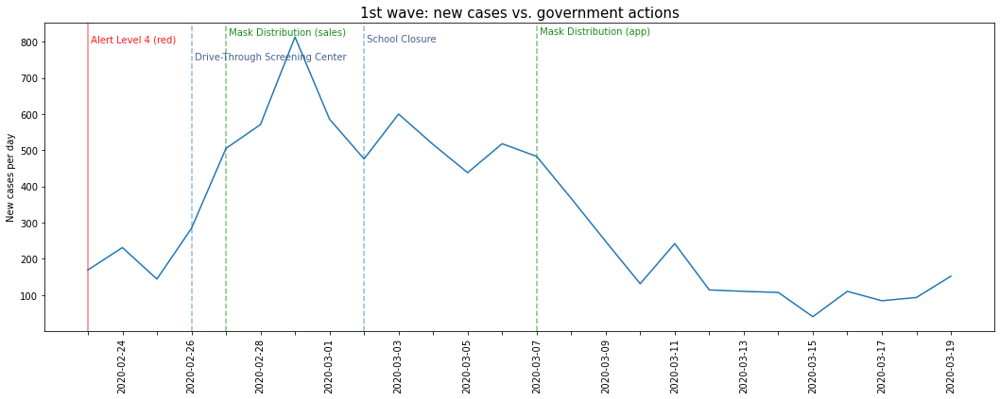

In [84]:
fig, events = plt.subplots(figsize=(18, 6))

sns.lineplot(data=wave_1st_cases, x="date", y="new cases")

events.axvline(x="2020-02-23", linestyle="solid", alpha=0.5, color="r")
events.text(x="2020-02-23", y=800, s=" Alert Level 4 (red)", alpha=0.9, color="r")

events.axvline(x="2020-02-26", linestyle="dashed", alpha=0.5)
events.text(
    x="2020-02-26",
    y=750,
    s=" Drive-Through Screening Center",
    alpha=0.9,
    color="#334f8d",
)

events.axvline(x="2020-02-27", linestyle="dashed", alpha=0.5, color="g")
events.text(x="2020-02-27", y=820, s=" Mask Distribution (sales)", alpha=0.9, color="g")

events.axvline(x="2020-03-02", linestyle="dashed", alpha=0.5)
events.text(x="2020-03-02", y=800, s=" School Closure", alpha=0.9, color="#334f8d")

events.axvline(x="2020-03-07", linestyle="dashed", alpha=0.5, color="g")
events.text(x="2020-03-07", y=820, s=" Mask Distribution (app)", alpha=0.9, color="g")

plt.xticks(rotation=90)
for label in events.get_xaxis().get_ticklabels()[::2]:
    label.set_visible(False)

plt.xlabel("")
plt.ylabel("New cases per day")
plt.title(
    "1st wave: new cases vs. government actions", fontsize=15
);

We possibly have a rough understanding what was happening in the beginning of the pandemic and what were the main actions from the government. But it was a second wave in June so let's check what was happening there - when immigration policies were still inline and people were already educated through social campaigns. 

## Second wave

In [80]:
# dataframe for patients from 2020-05-15 till 2020-06-30
wave_2n_patients = patients.query('confirmed_date > "2020-05-14"')
wave_2d_timeline = wave_2n_patients.groupby(["confirmed_date"]).agg(
    total=("patient_id", "count")
)

# by source
wave_2n_sources = wave_2n_patients.groupby(["upd_source"]).agg(
    total=("patient_id", "count")
)

# we already know what was done to deal with overseas inflow and contact with patient (social distancing).
# let's exlude these two and see what were other causes of infection.
wave_2n_sources_exl = wave_2n_sources.drop(
    ["contact with patient", "overseas inflow"]
).reset_index()

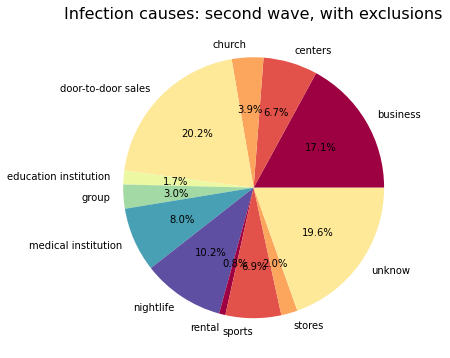

In [81]:
plt.figure(figsize=(10, 6))

cmap = plt.get_cmap("Spectral")
colors = [cmap(i) for i in np.linspace(0, 1, 8)]

wave_two = plt.pie(
    wave_2n_sources_exl["total"],
    labels=wave_2n_sources_exl["upd_source"],
    autopct="%1.1f%%",
    colors=colors,
)

plt.title("Infection causes: second wave, with exclusions", fontsize=16);

### Government regulations

In [82]:
wave_2n_policy = policy.query('start_date > "2020-05-14"')[
    ["type", "gov_policy", "detail", "start_date", "end_date"]
]

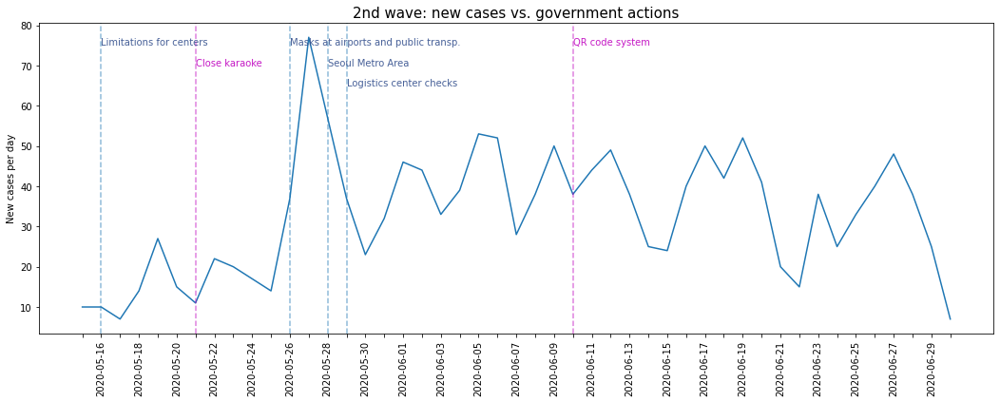

In [86]:
fig, events = plt.subplots(figsize=(18, 6))

sns.lineplot(data=wave_2d_timeline, x="confirmed_date", y="total")

events.axvline(x="2020-05-16", linestyle="dashed", alpha=0.5)
events.text(
    x="2020-05-16", y=75, s="Limitations for centers", alpha=0.9, color="#334f8d"
)

events.axvline(x="2020-05-21", linestyle="dashed", alpha=0.5, color="m")
events.text(x="2020-05-21", y=70, s="Close karaoke", alpha=0.9, color="m")

events.axvline(x="2020-05-26", linestyle="dashed", alpha=0.5)
events.text(
    x="2020-05-26",
    y=75,
    s="Masks at airports and public transp.",
    alpha=0.9,
    color="#334f8d",
)

events.axvline(x="2020-05-28", linestyle="dashed", alpha=0.5)
events.text(x="2020-05-28", y=70, s="Seoul Metro Area", alpha=0.9, color="#334f8d")

events.axvline(x="2020-05-29", linestyle="dashed", alpha=0.5)
events.text(
    x="2020-05-29", y=65, s="Logistics center checks", alpha=0.9, color="#334f8d"
)

events.axvline(x="2020-06-10", linestyle="dashed", alpha=0.5, color="m")
events.text(x="2020-06-10", y=75, s="QR code system", alpha=0.9, color="m")

plt.xticks(rotation=90)
for label in events.get_xaxis().get_ticklabels()[::2]:
    label.set_visible(False)

plt.xlabel("")
plt.ylabel("New cases per day")
plt.title("2nd wave: new cases vs. government actions", fontsize=15);

Additional precautions did not give immediate result but the spread also did not skyrocket. Interesting note, the popular entertainment in S.Korea - karaoke bars - were closed but only until the smart solution of QR code system. 

## Korea map of Covid-19 spread

The restrictions above, specifically the one for Seoul, made me wonder about the spread throughout the country. Let's see it on the map. 

In [91]:
# collecting and merging the data

patients_by_city = patients.groupby(["city"], as_index=False).agg(
    total=("patient_id", "count")
)
city_lats = region[["city", "latitude", "longitude"]]

cases_by_lats = pd.merge(patients_by_city, city_lats, how="left", on="city")
cases_by_lats.dropna(inplace=True)

In [35]:
cases_by_lats["total"].describe()

count    177.000000
mean      33.971751
std       54.997255
min        1.000000
25%        5.000000
50%       23.000000
75%       49.000000
max      639.000000
Name: total, dtype: float64

In [92]:
# grouping roughly by percentiles for better map visualization

def cases_in_range(num):
    if num <= 5:
        return 1
    elif num > 5 and num <= 25:
        return 5
    elif num > 25 and num <= 50:
        return 10
    elif num > 50 and num <= 100:
        return 15
    elif num > 100:
        return 20


cases_by_lats["cases_range"] = cases_by_lats["total"].apply(lambda x: cases_in_range(x))

In [93]:
covid_map = folium.Map([36, 128], zoom_start=6)

plugins.Fullscreen(
    position="topright",  # Full screen
    title="Click to Expand",
    title_cancel="Click to Exit",
    force_separate_button=True,
).add_to(covid_map)

geo = "https://raw.githubusercontent.com/southkorea/southkorea-maps/master/gadm/json/skorea-municipalities-geo.json"

folium.GeoJson(geo, name="seoul_municipalities").add_to(covid_map)

for i in range(0, len(cases_by_lats)):
    folium.CircleMarker(
        location=[
            cases_by_lats.iloc[i]["latitude"],
            cases_by_lats.iloc[i]["longitude"],
        ],
        popup=cases_by_lats.iloc[i]["city"],
        radius=int(cases_by_lats.iloc[i]["cases_range"]),
        color="crimson",
        fill=True,
        fill_color="crimson",
    ).add_to(covid_map)

for i in range(0, len(city_coord)):
    folium.Marker(
        [city_coord.iloc[i]["lat"], city_coord.iloc[i]["lng"]],
        popup=city_coord.iloc[i]["city"],
    ).add_to(covid_map)

covid_map

As expected, the biggest spread was in the biggest cities, especially near Seoul, where the population and density are the highest. 

## Hypothesis testing

### Covid-19 and elderly people

So now we saw the Covid-19 cases trends, who got infected, how and where. Also, what was the actions from the government. Now, let's see how badly people got sick or even died. 

In [94]:
deceased_patients = patients.query('state == "deceased"')
deceased_patients_by_age = deceased_patients.groupby("age").agg(
    total=("patient_id", "count")
)

In [95]:
patients_age_groups = patients.groupby(["age"], as_index=False).agg(
    total=("patient_id", "count")
)
patients_deceased_ratio = pd.merge(
    deceased_patients_by_age, patients_age_groups, how="left", on="age"
)
patients_deceased_ratio["ratio"] = (
    patients_deceased_ratio["total_x"] / patients_deceased_ratio["total_y"]
) * 100

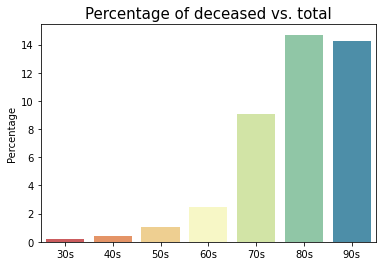

In [96]:
sns.barplot(data=patients_deceased_ratio, x="age", y="ratio", palette="Spectral")

plt.xlabel("")
plt.ylabel("Percentage")
plt.title("Percentage of deceased vs. total", fontsize=15);

It is obvious that virus is more deadly to the 60+ age group. Do this group also sick longer? 

In [97]:
# calculation how long patients were sick
patients_duration = patients.copy()

patients_duration["released_date"] = pd.to_datetime(
    patients_duration["released_date"], format="%Y-%m-%d"
)
patients_duration["confirmed_date"] = pd.to_datetime(
    patients_duration["confirmed_date"], format="%Y-%m-%d"
)
patients_duration["duration"] = (
    patients_duration.released_date - patients_duration.confirmed_date
)
patients_duration["duration_int"] = (
    patients_duration["duration"].dropna().dt.days.astype("int16")
)

In [42]:
patients_duration["duration_int"].describe()

count    1587.000000
mean       24.731569
std        13.051060
min         0.000000
25%        16.000000
50%        23.000000
75%        31.000000
max       114.000000
Name: duration_int, dtype: float64

In [98]:
def drop_last_letter(age):
    if age is np.nan:
        return np.nan
    age = age[:-1]
    return int(age)


patients_duration["age_int"] = patients_duration["age"].apply(lambda x: drop_last_letter(x))

In [99]:
duration_mean_total = patients_duration["duration_int"].mean()
duration_mean_younger = patients_duration.query("age_int < 60")["duration_int"].mean()
duration_mean_elderly = patients_duration.query("age_int >= 60")["duration_int"].mean()

print(
    "People younger than 60 years on average recovered in",
    round(duration_mean_younger, 0),
    "days",
)
print(
    "People 60 years and older on average recovered in",
    round(duration_mean_elderly, 0),
    "days",
)

People younger than 60 years on average recovered in 23.0 days
People 60 years and older on average recovered in 30.0 days


In [100]:
duration_younger = patients_duration.query("age_int < 60")["duration_int"].dropna()
duration_elderly = patients_duration.query("age_int >= 60")["duration_int"].dropna()
duration_total = patients_duration["duration_int"].dropna()

dur_younger = duration_younger.to_frame()
dur_elderly = duration_elderly.to_frame()
dur_younger["group"] = "up to 60"
dur_elderly["group"] = "60 and older"

frames = [dur_younger, dur_elderly]
dur_total = pd.concat(frames)

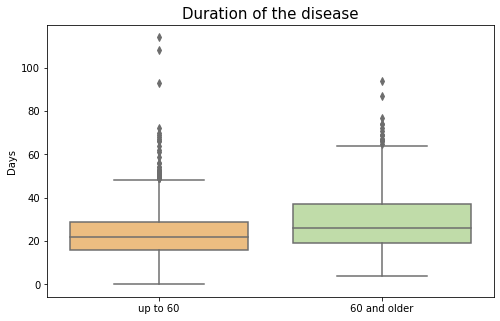

In [101]:
plt.figure(figsize=(8, 5))
sns.boxplot(x="group", y="duration_int", data=dur_total, palette="Spectral")

plt.xlabel("")
plt.ylabel("Days")
plt.title("Duration of the disease", fontsize=15);

On average, 60+ group people sick 7 days longer, but for younger people there are a lot of outliers from the mean. We heard that virus Covid-19 is especially dangerous for older people. We saw, that their mortality rate is obviously higher, but do their duration of disease also make significant difference? 

H_null = mean of duration of the disease of 60+ age group is the same as the population (total) / duration_mean_total = duration_mean_elderly 
H_alternative = mean of duration of the disease of 60+ age group is NOT the same as the population (total) / duration_mean_total != duration_mean_elderly 

In [102]:
# choose the data
duration_total = patients_duration["duration_int"].dropna()
duration_elderly = patients_duration.query("age_int >= 60")["duration_int"].dropna()

# take samples
total_sample = duration_total.sample(n=250)
elderly_sample = duration_elderly.sample(n=250)

# find p-value
t, p = stats.ttest_ind(elderly_sample, total_sample)

# testing with 90%, because overall situation overview is enough and I don't need high precision
if p < 0.1:
    print("The difference is significant, reject the null hypothesis")
if p > 0.1:
    print("The difference is not significant, cannot reject the null hypothesis")

The difference is significant, reject the null hypothesis


Take out from this calculation is that, indeed, we need to keep our elderly people safe.  

### Sickness duration

Another hypothesis raised while seeing new cases distribution over time was that overall people were sick longer towards the June. Let's check if it is statistically significant. 

H_null = mean of duration of the disease was the same during all period / duration_mean_total = duration_mean_second_half  
H_alternative = mean of duration of the disease was NOT the same during all period / duration_mean_total != duration_mean_second_half

In [119]:
# choose the data
second_half = patients_duration.query('confirmed_date >= "2020-05-01"')[
    "duration_int"
].dropna()

# take samples
total_smaller_sample = duration_total.sample(n=50)
second_half_sample = second_half.sample(n=50)

# find p-value
t, p = stats.ttest_ind(second_half_sample, total_smaller_sample)

# testing with 90%, because overall situation overview is enough and I don't need high precision
if p < 0.1:
    print("The difference is significant, reject the null hypothesis")
if p > 0.1:
    print("The difference is not significant, cannot reject the null hypothesis")

The difference is not significant, cannot reject the null hypothesis


## Clustering data

Let's go back to the infection sources and try to group them to see if there is any interesing clusters. Maybe it would help to prevent spread the infection. 

In [127]:
# choose the data
data_for_multidim = patients_duration[
    ["sex", "age_int", "infection_case", "city", "duration_int"]
].copy()
data_for_multidim = pd.merge(data_for_multidim, city_lats, how="left", on="city")

# reduce number of groups and assign color for visualization
def group_colors(case):
    if case == "contact with patient":
        return "red"
    if case == "overseas inflow":
        return "blue"
    if case == "etc" or case == "nan":
        return "yellow"
    else:
        return "green"


data_for_multidim["case_group"] = data_for_multidim["infection_case"].apply(
    lambda x: group_colors(x)
)
data_for_multidim.dropna(inplace=True)

data_for_multidim = data_for_multidim.drop(["infection_case", "city"], axis=1)

In [130]:
multi_data = pd.get_dummies(data_for_multidim)
multi_data.columns = [
    "age",
    "duration",
    "latitude",
    "longitude",
    "female",
    "male",
    "blue",
    "green",
    "red",
    "yellow",
]

In [50]:
# separating out the features
features_array = multi_data.values

# standardizing the features
x = MinMaxScaler().fit_transform(features_array)

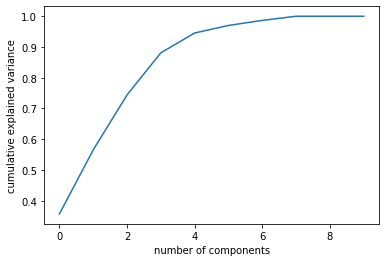

In [51]:
# how many components are needed to describe the data
pca = PCA().fit(x)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("number of components")
plt.ylabel("cumulative explained variance")

In [52]:
pca = PCA(n_components=3)
PCA_components = pca.fit_transform(x)
PCA_df = pd.DataFrame(
    data=PCA_components,
    columns=["principal component 1", "principal component 2", "principal component 3"],
)

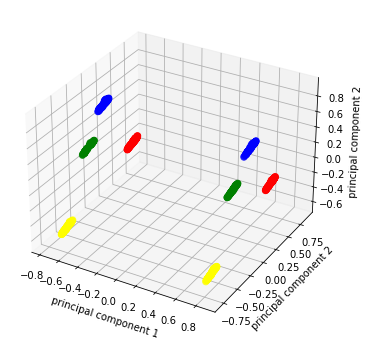

In [53]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

x = PCA_df["principal component 1"]
y = PCA_df["principal component 2"]
z = PCA_df["principal component 3"]

data = (x, y, z)
colors = data_for_multidim["case_group"]

ax.set_xlabel("principal component 1")
ax.set_ylabel("principal component 2")
ax.set_zlabel("principal component 2")

ax.scatter(x, y, z, s=40, c=colors, marker="o", alpha=0.7)

# plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

Colors help to understand that data was divided by case and mirroring view that it was separated by gender. 
City, age and duration of infection did not have such a big impact. 

In [54]:
# standardizing the features
x = MinMaxScaler().fit_transform(features_array)

tsne = TSNE(n_components=3)
tsne_components = tsne.fit_transform(x)
tsne_df = pd.DataFrame(
    data=tsne_components,
    columns=["tsne component 1", "tsne component 2", "tsne component 3"],
)

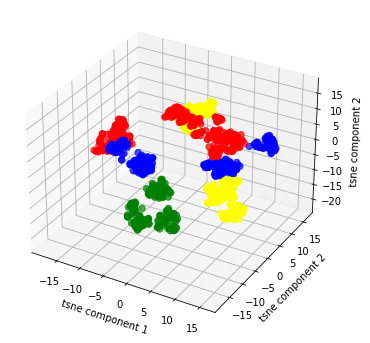

In [55]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

x = tsne_df["tsne component 1"]
y = tsne_df["tsne component 2"]
z = tsne_df["tsne component 3"]

data = (x, y, z)
colors = data_for_multidim["case_group"]

ax.set_xlabel("tsne component 1")
ax.set_ylabel("tsne component 2")
ax.set_zlabel("tsne component 2")

ax.scatter(x, y, z, s=40, c=colors, marker="o", alpha=0.7)

# plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

t-SNE lead to similar results, but here few groups have more obvious separation which could have been impacted by one of the features mentioned before.

Will we see different cluster from the PCA components with k-means clustering?

In [56]:
# first of all, let's calculate what would be the optimal number of k (clusters)

distortions = []
K = range(1, 10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(PCA_components)
    distortions.append(kmeanModel.inertia_)

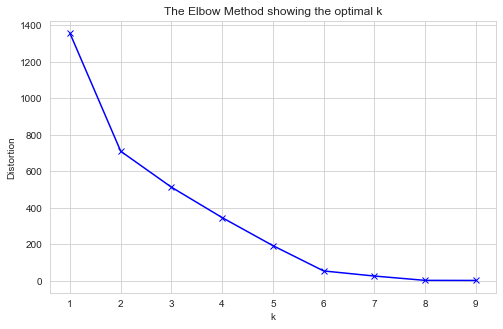

In [57]:
plt.figure(figsize=(8, 5))
sns.set_style("whitegrid")

plt.plot(K, distortions, "bx-")
plt.xlabel("k")
plt.ylabel("Distortion")
plt.title("The Elbow Method showing the optimal k")
plt.show()

In [58]:
# to besure about the elbow point, I took an additional function
kl = KneeLocator(range(1, 10), distortions, curve="convex", direction="decreasing")

kl.elbow

3

In [59]:
kmeanModel = KMeans(n_clusters=kl.elbow)
kmeans = kmeanModel.fit(PCA_components)

In [60]:
data_for_multidim["k_means"] = kmeanModel.predict(PCA_components)

In [61]:
def k_mean_colors(number):
    if number == 0:
        return "red"
    if number == 1:
        return "blue"
    if number == 2:
        return "yellow"


data_for_multidim["k_mean_color"] = data_for_multidim["k_means"].apply(
    lambda x: k_mean_colors(x)
)

In [62]:
clusters_0 = data_for_multidim.query("k_means == 0")
clusters_1 = data_for_multidim.query("k_means == 1")
clusters_2 = data_for_multidim.query("k_means == 2")

# print(clusters_0.mean(), clusters_1.mean(), clusters_2.mean())

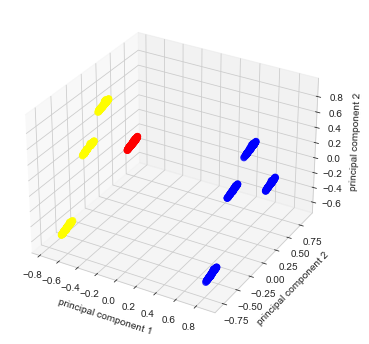

In [63]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

x = PCA_df["principal component 1"]
y = PCA_df["principal component 2"]
z = PCA_df["principal component 3"]

data = (x, y, z)
colors = data_for_multidim["k_mean_color"]

ax.set_xlabel("principal component 1")
ax.set_ylabel("principal component 2")
ax.set_zlabel("principal component 2")

ax.scatter(x, y, z, s=40, c=colors, marker="o", alpha=0.7)

# plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

k-means method separated 3 groups - male (red), female (blue) and female with a "contact with patient" infection reason (yellow). 

## Modelling

It seems that there is a good separation between gender groups. Let's see if logistic regression would help us to identify it. 

In [151]:
# data for the model - trying to predict gender
patients_data = patients_duration[
    ["sex", "age_int", "duration_int", "city", "upd_source"]
]
log_data = pd.merge(patients_data, city_lats, how="left", on="city")


def source_groups(case):
    if case == "contact with patient":
        return "contact with patient"
    if case == "overseas inflow":
        return "overseas inflow"
    if case == "etc" or case == "nan":
        return "unknown"
    else:
        return "group of people"


log_source_data["source_group"] = log_source_data["upd_source"].apply(
    lambda x: source_groups(x)
)

log_source_data = log_source_data.drop(["upd_source"], axis = 1)

log_data_enc = pd.get_dummies(log_source_data)

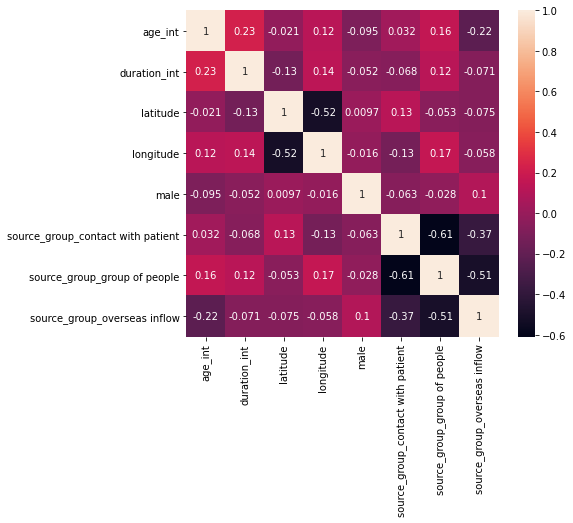

In [153]:
features_corr = log_data_enc.corr()

plt.figure(figsize=(7, 6))
sns.heatmap(features_corr, annot=True);

In [156]:
features = log_data_enc.drop(["male"], axis=1)
target = log_data_enc["male"]

In [157]:
x = StandardScaler().fit_transform(features)
y = target

train_x, test_x, train_y, test_y = train_test_split(
    x, y, test_size=0.2, random_state=42
)

model_log = LogisticRegression()
model_log.fit(train_x, train_y)

pred_y = model_log.predict(test_x)

print("Coefficient of determination (R^2):", model_log.score(test_x, test_y))
print("Classification report:\n", classification_report(test_y, pred_y))

Coefficient of determination (R^2): 0.5193798449612403
Classification report:
               precision    recall  f1-score   support

         0.0       0.51      0.75      0.61       129
         1.0       0.54      0.29      0.37       129

    accuracy                           0.52       258
   macro avg       0.52      0.52      0.49       258
weighted avg       0.52      0.52      0.49       258



As we saw from correlations, none of the features had a strong correlation with the target. Even though gender is a strong feature while clustering, it is not predictable from other features like age, city or infection source. We could make an assumption that gender does not have influence on infection. 

# Conclusions

From all the data analysis above the first suggestion would be to collect data about the patients as good as possible. It would help to make better decisions if we know the causes behind and can group people to target them better. 

Another, suggestion is to 'keep pulse' constantly and act immediatelly.

Depending on situation, the main suggestions would be: 
* social distancing programs (could include online solutions for communication with friends and family)
* and hygiene education;
* mandatory masks _(with possibility to get it)_;
* mandatory 14 days self-quarantine after being abroad;
* invest in technologies to have a better track of possibly infected people
* and people who violated self-quarantine regulation;
* additional attention should go to elderly people: helping them to avoid crowded places and not letting infection get to the elderly centers, etc.
